[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# How to Train YOLOv5 on Custom Objects

**⚠️ This notebook was updated on October 24th, 2023. Since then, the way to load data into the notebook has changed. Thus, this notebook is not the same as the original version used in the accompanying YouTube video or blog post.**

This tutorial is based on the [YOLOv5 repository](https://github.com/ultralytics/yolov5) by [Ultralytics](https://www.ultralytics.com/). This notebook shows training on **your own custom objects**. Many thanks to Ultralytics for putting this repository together - we hope that in combination with clean data management tools at Roboflow, this technologoy will become easily accessible to any developer wishing to use computer vision in their projects.

### Accompanying Blog Post

We recommend that you follow along in this notebook while reading the blog post on [how to train YOLOv5](https://blog.roboflow.ai/how-to-train-yolov5-on-a-custom-dataset/), concurrently.

### Steps Covered in this Tutorial

In this tutorial, we will walk through the steps required to train YOLOv5 on your custom objects. We use a [public blood cell detection dataset](https://public.roboflow.ai/object-detection/bccd), which is open source and free to use. You can also use this notebook on your own data.

To train our detector we take the following steps:

* Install YOLOv5 dependencies
* Download custom YOLOv5 object detection data
* Write our YOLOv5 Training configuration
* Run YOLOv5 training
* Evaluate YOLOv5 performance
* Visualize YOLOv5 training data
* Run YOLOv5 inference on test images
* Export saved YOLOv5 weights for future inference

Let's get started!

#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 064365d8683fd002e9ad789c1e91fa3d021b44f0

Cloning into 'yolov5'...
remote: Enumerating objects: 16656, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 16656 (delta 1), reused 5 (delta 0), pack-reused 16649
Receiving objects: 100% (16656/16656), 15.12 MiB | 28.36 MiB/s, done.
Resolving deltas: 100% (11438/11438), done.
/content/yolov5
HEAD is now at 064365d8 Update parse_opt() in export.py to work as in train.py (#10789)


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.3.0+cu121 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40)


In [ ]:
!pip install roboflow

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="RpzjqD048vaNzxiav0PF")
project = rf.workspace("planes-zmdv1").project("aircraft-classification-oanre")
version = project.version(5)
dataset = version.download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Aircraft-Classification-5 in yolov5pytorch:: 100%|██████████| 11238/11238 [00:01<00:00, 6966.58it/s]


In [ ]:
%cd /content/

/content


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat /content/Aircraft-Classification-5/data.yaml

cat: /content/Aircraft-Classification-5/data.yaml: No such file or directory


# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [ ]:
# define number of classes based on YAML
import yaml
with open("/content/yolov5/Aircraft-Classification-5/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [ ]:
#this is the model configuration we will use for our tutorial
%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
import numpy as np
from sklearn.model_selection import ParameterSampler

# Define the parameter grid to search
param_grid = {
    'batch_size': [16, 32, 64],
    'momentum': [0.9, 0.93, 0.96, 0.99],
    'weight_decay': [0.1, 0.01, 0.001]
}

# Create a parameter sampler
n_iter = 15  # Number of parameter settings that are sampled
param_list = list(ParameterSampler(param_grid, n_iter=n_iter, random_state=42))

# Print the chosen hyperparameters
for i, params in enumerate(param_list):
    print(f"Hyperparameters set {i+1}: {params}")


Hyperparameters set 1: {'weight_decay': 0.001, 'momentum': 0.99, 'batch_size': 64}
Hyperparameters set 2: {'weight_decay': 0.01, 'momentum': 0.9, 'batch_size': 32}
Hyperparameters set 3: {'weight_decay': 0.001, 'momentum': 0.9, 'batch_size': 64}
Hyperparameters set 4: {'weight_decay': 0.1, 'momentum': 0.96, 'batch_size': 64}
Hyperparameters set 5: {'weight_decay': 0.01, 'momentum': 0.93, 'batch_size': 32}
Hyperparameters set 6: {'weight_decay': 0.01, 'momentum': 0.96, 'batch_size': 64}
Hyperparameters set 7: {'weight_decay': 0.1, 'momentum': 0.99, 'batch_size': 32}
Hyperparameters set 8: {'weight_decay': 0.1, 'momentum': 0.9, 'batch_size': 32}
Hyperparameters set 9: {'weight_decay': 0.001, 'momentum': 0.96, 'batch_size': 16}
Hyperparameters set 10: {'weight_decay': 0.001, 'momentum': 0.93, 'batch_size': 32}


In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train.py --img 416 --batch 64 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp1 --optimizer SGD --cache

/content
2024-06-08 08:36:39.327547: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 08:36:39.327599: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 08:36:39.378472: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 08:36:39.386388: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 08:36:40.565970: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train2.py --img 416 --batch 32 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp2 --optimizer SGD --cache

/content
2024-06-08 09:12:02.193517: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 09:12:02.193568: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 09:12:02.194935: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 09:12:02.202186: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 09:12:03.503086: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train3.py --img 416 --batch 64 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp3 --optimizer SGD --cache

/content
2024-06-08 09:50:17.055855: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 09:50:17.055907: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 09:50:17.057258: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 09:50:17.064500: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 09:50:18.380780: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train4.py --img 416 --batch 64 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp4 --optimizer SGD --cache

/content
2024-06-08 10:25:00.311214: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 10:25:00.311271: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 10:25:00.313528: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 10:25:00.324351: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 10:25:02.069332: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train5.py --img 416 --batch 32 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp5 --optimizer SGD --cache

/content
2024-06-08 10:59:27.076225: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 10:59:27.076277: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 10:59:27.078288: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 10:59:27.089261: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 10:59:28.915873: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train6.py --img 416 --batch 64 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp6 --optimizer SGD --cache

/content
2024-06-08 11:36:53.112888: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 11:36:53.112935: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 11:36:53.114367: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 11:36:53.122114: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 11:36:54.375489: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train7.py --img 416 --batch 32 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp7 --optimizer SGD --cache

/content
2024-06-08 12:11:44.575225: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 12:11:44.575282: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 12:11:44.577146: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 12:11:44.586285: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 12:11:45.913711: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train8.py --img 416 --batch 32 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp8 --optimizer SGD --cache

/content
2024-06-08 12:49:46.654502: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 12:49:46.654564: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 12:49:46.656552: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 12:49:46.667437: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 12:49:48.083192: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train9.py --img 416 --batch 16 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp9 --optimizer SGD --cache

/content
2024-06-08 13:27:23.193266: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 13:27:23.193312: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 13:27:23.194769: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 13:27:23.202078: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 13:27:24.451657: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train10.py --img 416 --batch 32 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp10 --optimizer SGD --cache

/content
2024-06-08 14:38:08.229049: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 14:38:08.229108: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 14:38:08.231062: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 14:38:08.242653: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 14:38:09.572662: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train11.py --img 416 --batch 16 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp11 --optimizer SGD --cache

/content
2024-06-08 15:16:23.831260: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 15:16:23.831331: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 15:16:23.833264: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 15:16:23.844279: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 15:16:25.754909: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train12.py --img 416 --batch 64 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp12 --optimizer SGD --cache

/content
2024-06-08 16:01:11.767624: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 16:01:11.767703: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 16:01:11.769175: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 16:01:11.777426: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 16:01:13.077305: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train13.py --img 416 --batch 16 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp13 --optimizer SGD --cache

/content
2024-06-08 16:37:07.252333: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 16:37:07.252395: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 16:37:07.254436: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 16:37:07.265735: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 16:37:08.981465: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train14.py --img 416 --batch 16 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp14 --optimizer SGD --cache

/content
2024-06-08 17:23:18.439466: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 17:23:18.439523: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 17:23:18.441083: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 17:23:18.449063: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 17:23:19.770901: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train15.py --img 416 --batch 64 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/hyp15 --optimizer SGD --cache

/content
2024-06-08 18:20:47.877369: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 18:20:47.877436: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 18:20:47.878911: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 18:20:47.886557: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 18:20:49.358637: W tensorflow/com

In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train.py --img 416 --batch 32 --epochs 500 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/final_model --optimizer SGD --cache --patience 10

/content
2024-06-08 19:14:21.291920: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-08 19:14:21.291977: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-08 19:14:21.293498: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-08 19:14:21.302376: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-08 19:14:22.960301: W tensorflow/com

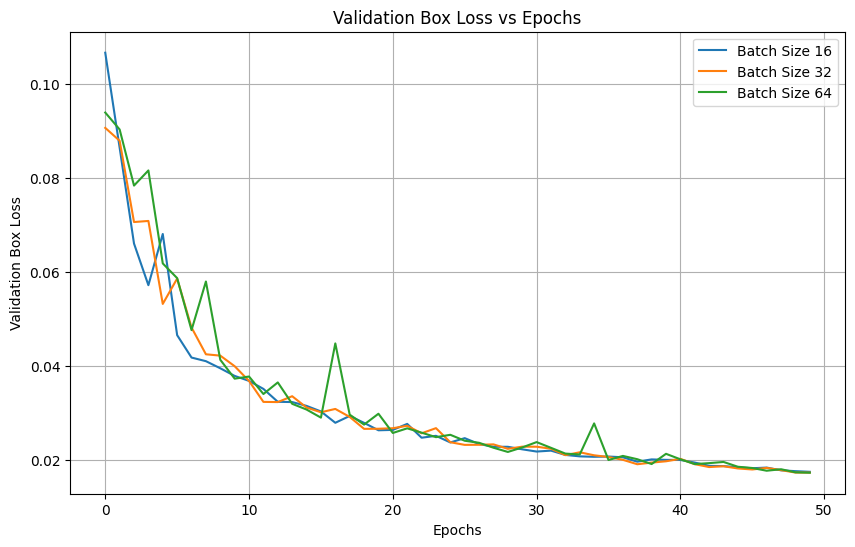

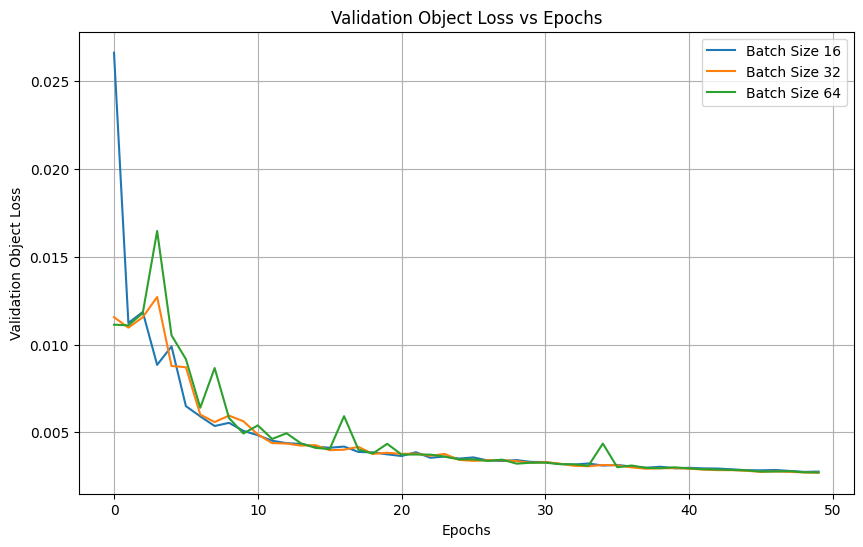

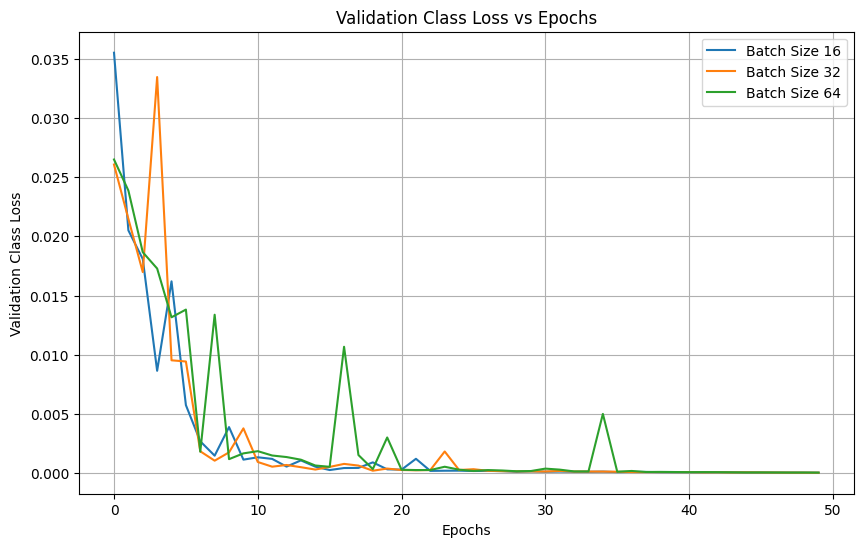

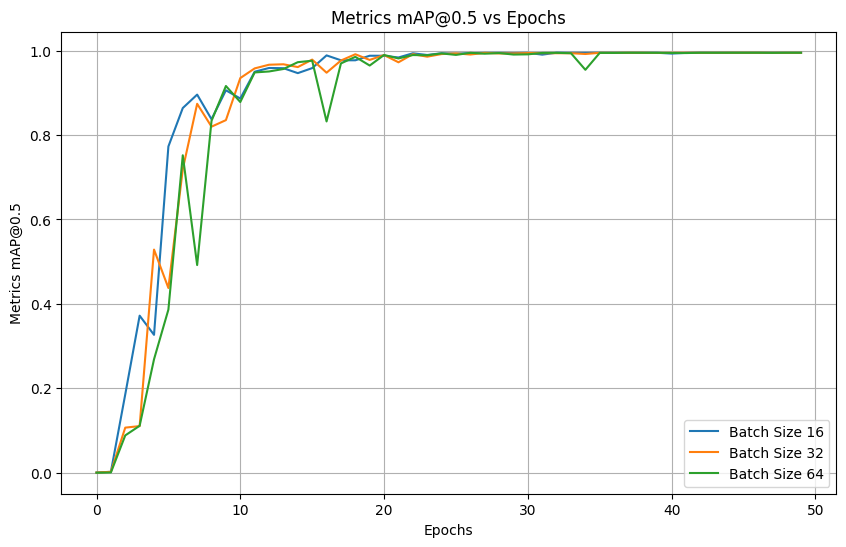

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV files
model1 = pd.read_csv('/content/drive/MyDrive/yolov5s_results/batch16/results.csv')
model2 = pd.read_csv('/content/drive/MyDrive/yolov5s_results/batch32/results.csv')
model3 = pd.read_csv('/content/drive/MyDrive/yolov5s_results/batch64/results.csv')

model1.columns = model1.columns.str.strip()
model2.columns = model2.columns.str.strip()
model3.columns = model3.columns.str.strip()

# Define a function to plot the values
def plot_metrics(models, metric, ylabel, title):
    plt.figure(figsize=(10, 6))
    for model, label in models:
        plt.plot(model['epoch'], model[metric], label=label)
    plt.xlabel('Epochs')
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

# Prepare the data and labels
models = [(model1, 'Batch Size 16'), (model2, 'Batch Size 32'), (model3, 'Batch Size 64')]

# Plot val/box_loss against epochs for 3 models
plot_metrics(models, 'val/box_loss', 'Validation Box Loss', 'Validation Box Loss vs Epochs')

# Plot val/obj_loss against epochs for 3 models
plot_metrics(models, 'val/obj_loss', 'Validation Object Loss', 'Validation Object Loss vs Epochs')

# Plot val/cls_loss against epochs for 3 models
plot_metrics(models, 'val/cls_loss', 'Validation Class Loss', 'Validation Class Loss vs Epochs')

# Plot metrics/mAP_0.5 against epochs for 3 models
plot_metrics(models, 'metrics/mAP_0.5', 'Metrics mAP@0.5', 'Metrics mAP@0.5 vs Epochs')


In [ ]:
# train yolov5s on custom data for 100 epochs
# time its performance
%%time
%cd /content
!python ./yolov5/train.py --img 416 --batch 16 --epochs 50 --data /content/yolov5/Aircraft-Classification-5/data.yaml --cfg /content/yolov5/models/custom_yolov5s.yaml --weights '' --name /content/drive/MyDrive/yolov5s_results/AdamW --optimizer SGD --cache --patience

/content
2024-06-03 00:06:03.489432: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-03 00:06:03.489505: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-03 00:06:03.491576: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-03 00:06:03.505838: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-06-03 00:06:06.379611: W tensorflow/com

# Evaluate Custom YOLOv5 Detector Performance

You can view the training graphs associated with a training job in the `/content/yolov5/runs/train/yolov5s_results/results.png` folder.

Training losses and performance metrics are also saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [ ]:
from utils.plots import plot_results  # plot results.txt as results.png
from PIL import Image
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)  # view results.png

TypeError: 'module' object is not callable

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

In [ ]:
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch1_pred.jpg', width=900)

TypeError: 'module' object is not callable

In [ ]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

# Run Inference With Trained Weights

Next, we can run inference with a pretrained checkpoint on all images in the `test/images` folder to understand how our model performs on our test set.

In [ ]:
# trained weights are saved by default in our weights folder
%ls runs/

detect/  train/


In [ ]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In the snippet below, replace `Cash-Counter-10` with the name of the folder in which your dataset is stored.

In [ ]:
%cd /content/yolov5/
!python detect.py --weights /content/drive/MyDrive/yolov5s_results/final_model/weights/best.pt --img 416 --conf 0.4 --source /content/yolov5/Aircraft-Classification-5/test/images

/content/yolov5
detect: weights=['/content/drive/MyDrive/yolov5s_results/final_model/weights/best.pt'], source=/content/yolov5/Aircraft-Classification-5/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d8 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 182 layers, 7249215 parameters, 0 gradients
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/763 /content/yolov5/Aircraft-Classification-5/test/images/0_041122easyjet1_webp_jpg.rf.3aa37ddb5e821d84531eb07479e11a06.jpg: 416x416 1 commercial, 7.7ms
image 2/763 /content/yolov5/Aircraft-Classification-5/test/ima

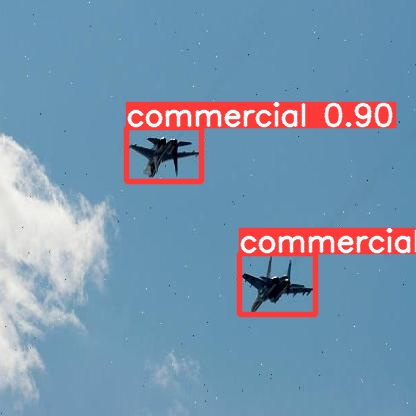

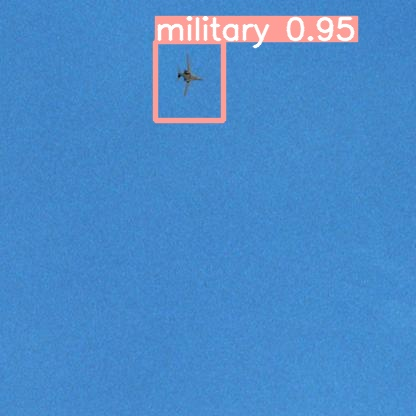

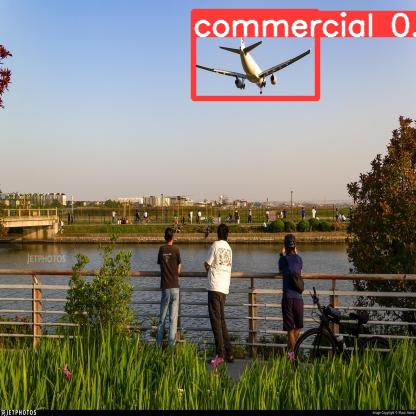

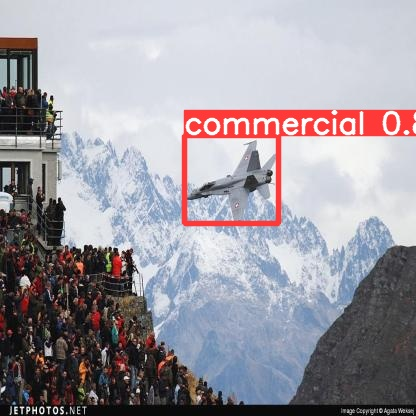

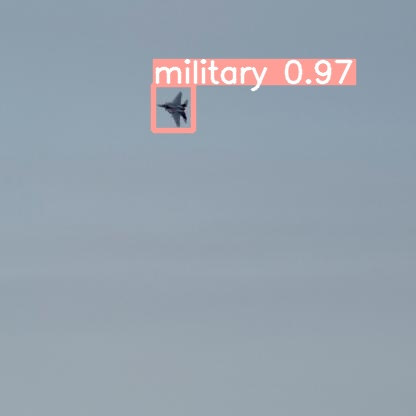

...

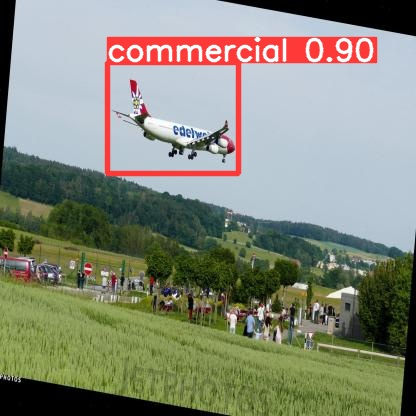

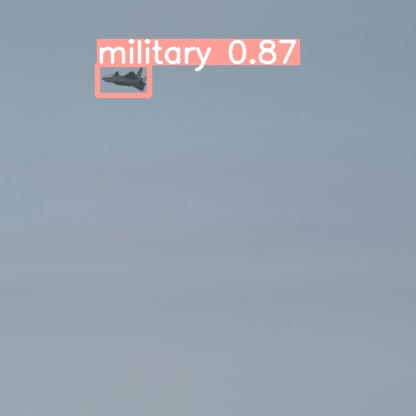

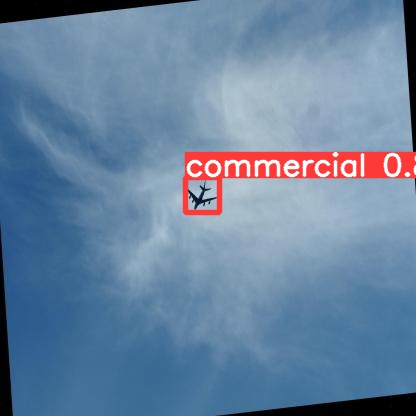

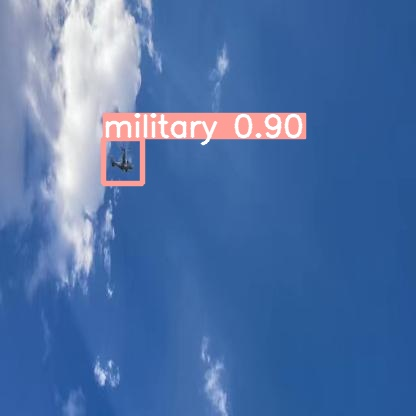

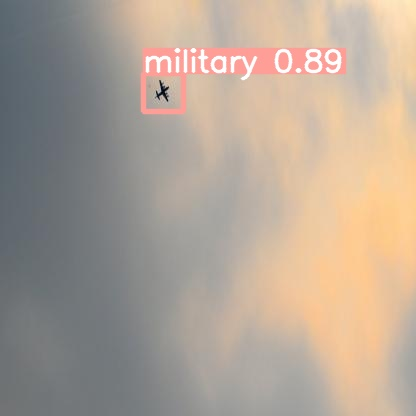

In [ ]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp3/*.jpg'): #assuming JPG
    display(Image(filename=imageName))

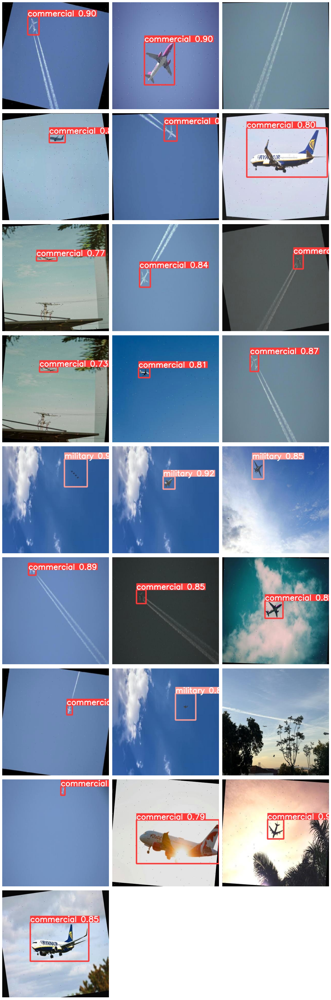

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import glob

# Set up the figure and axes
num_images = 25
num_rows = num_images // 3  # Number of rows
if num_images % 3 != 0:
    num_rows += 1

fig, axes = plt.subplots(num_rows, 3, figsize=(15, num_rows * 5))

# Flatten the axes array if there's only one row
if num_rows == 1:
    axes = [axes]

# Iterate through image paths and display each image
for i, imageName in enumerate(glob.glob('/content/yolov5/runs/detect/exp3/*.jpg')[:num_images]):
    row = i // 3
    col = i % 3
    img = Image.open(imageName)
    img.thumbnail((1000, 1000))  # Resize the image
    axes[row][col].imshow(img)
    axes[row][col].axis('off')

# Remove any unused axes
for i in range(num_images, num_rows * 3):
    row = i // 3
    col = i % 3
    axes[row][col].axis('off')

plt.tight_layout()
plt.savefig('test_predictions_try1.png')
plt.show()


## Deploy Model on Roboflow

Once you have finished training your YOLOv5 model, you’ll have a set of trained weights ready for use. These weights will be in the `/content/yolov5/runs/train/yolov5s_results/` folder of your project. You can upload your model weights to Roboflow Deploy to use your trained weights on our infinitely scalable infrastructure.

The `.deploy()` function in the [Roboflow pip package](https://docs.roboflow.com/python) now supports uploading YOLOv5 weights.

**Before you run this code, make sure you create a new Version in the Roboflow dashboard following the instructions we covered earlier. Fill in your project name, workspace, and version number below.**

To upload model weights, add the following code to the “Inference with Custom Model” section in the aforementioned notebook:

In [ ]:
rf = Roboflow(api_key="YOUR_API_KEY")
project = rf.workspace("workspace").project("project")
dataset = project.version(1)

project.version(dataset.version).deploy(model_type="yolov5", model_path=f"/content/yolov5/runs/train/yolov5s_results/")

In [ ]:
#Run inference on your model on a persistant, auto-scaling, cloud API

#load model
model = project.version(dataset.version).model

#choose random test set image
import os, random
test_set_loc = dataset.location + "/test/images/"
random_test_image = random.choice(os.listdir(test_set_loc))
print("running inference on " + random_test_image)

pred = model.predict(test_set_loc + random_test_image, confidence=40, overlap=30).json()
pred

# Deploy Your Model to the Edge

In addition to using the Roboflow hosted API for deployment, you can use [Roboflow Inference](https://inference.roboflow.com), an open source inference solution that has powered millions of API calls in production environments. Inference works with CPU and GPU, giving you immediate access to a range of devices, from the NVIDIA Jetson to TRT-compatible devices to ARM CPU devices.

With Roboflow Inference, you can self-host and deploy your model on-device. You can deploy applications using the [Inference Docker containers](https://inference.roboflow.com/quickstart/docker/) or the pip package.

For example, to install Inference on a device with an NVIDIA GPU, we can use:

```
docker pull roboflow/roboflow-inference-server-gpu
```

Then we can run inference via HTTP:

```python
import requests

workspace_id = ""
model_id = ""
image_url = ""
confidence = 0.75
api_key = ""
iou_threshold = 0.5

infer_payload = {
    "image": {
        "type": "url",
        "value": image_url,
    },
    "confidence": confidence,
    "iou_threshold": iou_threshold,
    "api_key": api_key,
}
res = requests.post(
    f"http://localhost:9001/{workspace_id}/{model_id}",
    json=infer_object_detection_payload,
)

predictions = res.json()
```

Above, set your Roboflow workspace ID, model ID, and API key.

- [Find your workspace and model ID](https://docs.roboflow.com/api-reference/workspace-and-project-ids?ref=blog.roboflow.com)
- [Find your API key](https://docs.roboflow.com/api-reference/authentication?ref=blog.roboflow.com#retrieve-an-api-key)

Also, set the URL of an image on which you want to run inference. This can be a local file.

_To use your YOLOv5 model commercially with Inference, you will need a Roboflow Enterprise license, through which you gain a pass-through license for using YOLOv5. An enterprise license also grants you access to features like advanced device management, multi-model containers, auto-batch inference, and more._

## 🏆 Congratulations

### Learning Resources

Roboflow has produced many resources that you may find interesting as you advance your knowledge of computer vision:

- [Roboflow Notebooks](https://github.com/roboflow/notebooks): A repository of over 20 notebooks that walk through how to train custom models with a range of model types, from YOLOv7 to SegFormer.
- [Roboflow YouTube](https://www.youtube.com/c/Roboflow): Our library of videos featuring deep dives into the latest in computer vision, detailed tutorials that accompany our notebooks, and more.
- [Roboflow Discuss](https://discuss.roboflow.com/): Have a question about how to do something on Roboflow? Ask your question on our discussion forum.
- [Roboflow Models](https://roboflow.com): Learn about state-of-the-art models and their performance. Find links and tutorials to guide your learning.

### Convert data formats

Roboflow provides free utilities to convert data between dozens of popular computer vision formats. Check out [Roboflow Formats](https://roboflow.com/formats) to find tutorials on how to convert data between formats in a few clicks.

### Connect computer vision to your project logic

[Roboflow Templates](https://roboflow.com/templates) is a public gallery of code snippets that you can use to connect computer vision to your project logic. Code snippets range from sending emails after inference to measuring object distance between detections.